In [82]:
import shapely as shp
from shapely.geometry import LineString, MultiPolygon, MultiLineString, LinearRing, Point, Polygon, MultiPoint
from shapely.ops import linemerge,polygonize
import geopandas as gpd
import os
import numpy as np


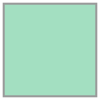

In [8]:
grid_gdf=gpd.read_parquet('/home/pedro/Documents/GIT_WORKSPACE/split_offdb/inputs/grid.parquet')
unidade_split = grid_gdf[grid_gdf["grid_id"] == 24].geometry.values[0]
unidade_split

In [19]:
gdf=gpd.read_parquet('/home/pedro/Documents/GIT_WORKSPACE/split_offdb/dev/grid_24_al.parquet')
gdf.head()

,id,geom
0,108821,"POLYGON ((-36.49884 -9.5, -36.49886 -9.49946, ..."
1,73800,"POLYGON ((-36.5 -9.49062, -36.49847 -9.49103, ..."
2,144237,"POLYGON ((-36.5 -9.49028, -36.49834 -9.49072, ..."
3,175432,"POLYGON ((-36.5 -9.49066, -36.49952 -9.49077, ..."
4,110765,"POLYGON ((-36.5 -9.48991, -36.49996 -9.48992, ..."


In [72]:

linerings=[]
for index, row in gdf.iterrows():
    geom=row.geom

    if isinstance(geom, MultiPolygon):
        geom= geom.geoms[0]
        line=geom.exterior

    elif isinstance(geom, Polygon):
        geom = geom
        line=geom.exterior



#Se a geometria for invalida, joga no lixo
    if line.is_valid:
        try:
            
            linerings.append(LinearRing(unidade_split.boundary))
            #Cria um MultiLineString a partir de todas as linhas
            multi_line=MultiLineString(linerings)
            #Cria o MultiLineString com nós
            multi_line_with_nodes=shp.node(multi_line)

        except:
            print('lalal')
    

    else:
        print(f"Feição descartada - ID: {row['id']}, ID Layer: {row['id_layer']}, Geometria: {geom}")







multi_line_with_nodes






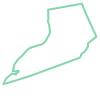

In [86]:
LinearRing(gdf.loc[913].geom.boundary.geoms[0])

In [ ]:
polygons = [poly for poly in list(polygonize(multi_line_with_nodes))]
output= gpd.GeoDataFrame(data = {'id': range(1, (polygons.__len__()+1))}, geometry = polygons)
output.to_file('/home/pedro/Documents/GIT_WORKSPACE/split_offdb/dev/polygons_case_output.shp', driver = 'ESRI Shapefile')

In [1]:
# Cria um índice espacial para `input_gdf`
input_sindex = gdf.sindex

# Filtra apenas as geometrias que têm bbox sobrepondo `unidade_split`
possible_matches_index = list(input_sindex.intersection(unidade_split.bounds))
possible_matches = gdf.iloc[possible_matches_index]

# Calcula as interseções reais e armazena apenas as interseções não vazias
intersections = []
for idx, geom in possible_matches.iterrows():
    if geom['geometry'].is_valid:
        # Calcula a interseção com `geom.intersection(self.unidade_split)`
        intersection = geom['geometry'].intersection(unidade_split)
        if not intersection.is_empty:
            intersections.append({
                **geom,  # Inclui todas as colunas de atributos originais
                'geometry': intersection  # Substitui a geometria pela interseção
            })
        else:
            print('Geometria vazia')
    else:
        print('Descartando geometria inválida...')


#MultiPolygon(gdf_input_intersection['geometry'])
polygons = [geom for geom in gdf_input_intersection['geometry']]

# Cria um novo GeoDataFrame com as interseções reais
gdf_input_intersection = gpd.GeoDataFrame(geometry=polygons, crs=gdf.crs)
gdf_input_intersection

NameError: name 'gdf' is not defined

In [9]:
data = gpd.read_parquet('/home/pedro/Documents/GIT_WORKSPACE/split_offdb/inputs/input.parquet')
data.head()

,id,id_layer,geom
0,56285,CAR,"MULTIPOLYGON (((-36.73056 -9.49319, -36.72995 ..."
1,56286,CAR,"MULTIPOLYGON (((-36.73972 -9.49228, -36.73828 ..."
2,56287,CAR,"MULTIPOLYGON (((-36.73341 -9.49867, -36.7327 -..."
3,56894,CAR,"MULTIPOLYGON (((-36.65406 -9.59078, -36.65379 ..."
4,58371,CAR,"MULTIPOLYGON (((-37.50167 -9.29629, -37.5036 -..."
